### Zadania

Lista składa się z dwóch sekcji: pierwsza (zadania 1 i 2) dotyczy metod detekcji krawędzi, druga (zadania 3 i 4) operacji na histogramach.

In [41]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

##### Zad. 1: Wyznaczenie gradientów

Wykonaj dla obrazu `coins` sztuczny obraz ilustrujący wielkość (moduł) wektora gradientu w danym punkcie. Do wyświetlenia użyj [mapy kolorów](https://matplotlib.org/stable/tutorials/colors/colormaps.html) `hot` do oznaczenia wielkości gradientu odpowiednim kolorem – im większa wartość, tym bardziej czerwony (_mapa ciepła_).  
Gdzie gradienty są bliskie zera?  
Czy uzyskany wynik pozwoliłby np. na detekcję obiektów?

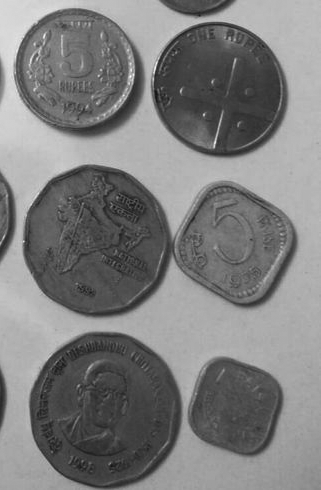

In [42]:
coins = cv2.imread('Monety_szare.bmp', cv2.IMREAD_GRAYSCALE)
Image.fromarray(coins)

Rozwiązanie:

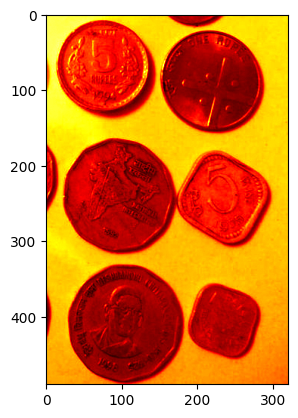

In [43]:
plt.imshow(coins, cmap='hot') # przykład wyświetlania z mapą kolorów

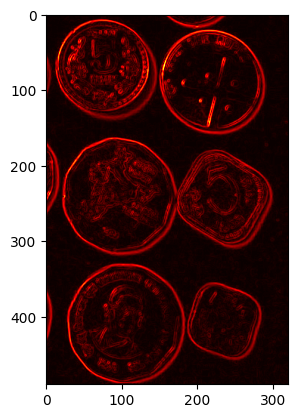

In [44]:
sobel_x = cv2.Sobel(coins, cv2.CV_64F, 1, 0)
sobel_y = cv2.Sobel(coins, cv2.CV_64F, 0, 1) 

gradient_module = np.sqrt(sobel_x**2 + sobel_y**2)

gradient_norm = cv2.normalize(gradient_module, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

plt.imshow(gradient_norm, cmap='hot')

---

##### Zad. 2: Detekcja krawędzi

Przeprowadź z obrazem `coins_noise` takie przekształcenia, aby zmaksymalizować możliwość rozpoznania obiektów. Wykorzystaj [filtr Canny'ego](https://docs.opencv.org/4.x/dd/d1a/group__imgproc__feature.html#ga04723e007ed888ddf11d9ba04e2232de) do detekcji krawędzi; zbadaj jego zachowanie w zależności od wartości progów oraz sposobu redukcji szumu.

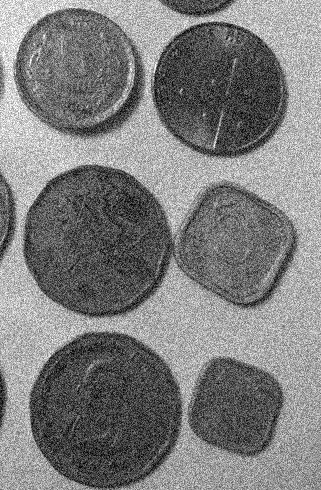

In [45]:
coins_noise = cv2.imread('Monety_szare_szum.bmp', cv2.IMREAD_GRAYSCALE)
Image.fromarray(coins_noise)

Rozwiązanie:

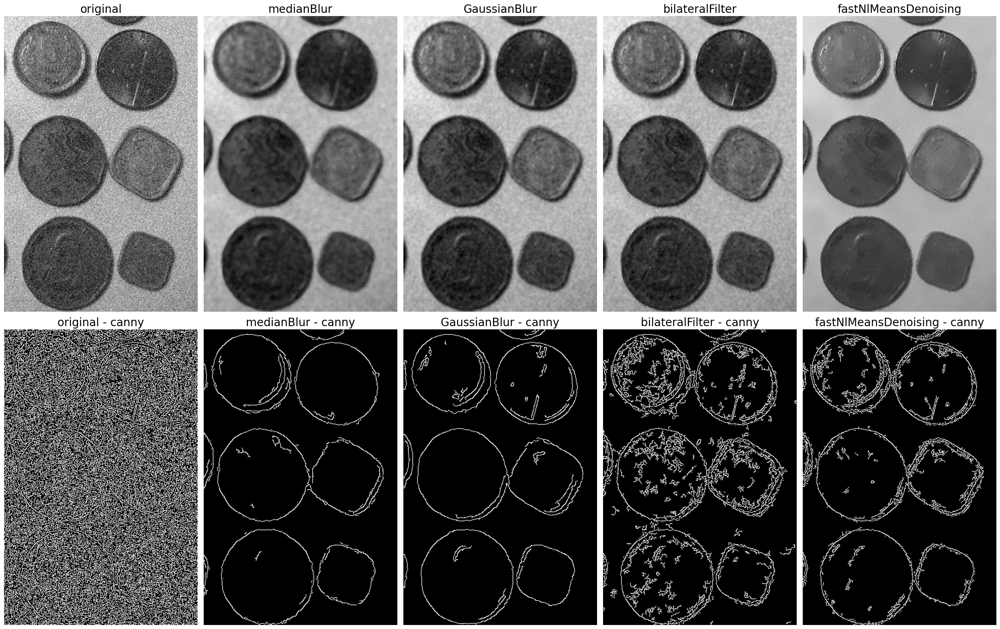

In [46]:
blur_functions = [("medianBlur", cv2.medianBlur, [7]), ("GaussianBlur", cv2.GaussianBlur, [(7, 7), 0]), ("bilateralFilter", cv2.bilateralFilter, [7, 50, 50]),
                  ("fastNlMeansDenoising", cv2.fastNlMeansDenoising, [None, 20, 7, 21])]

images = [coins_noise]
processed_images = [cv2.Canny(coins_noise, 50, 150)]
for title, function, args in blur_functions:
    img = function(coins_noise, *args)
    processed_img = cv2.Canny(img, 50, 150)
    images.append(img)
    processed_images.append(processed_img)

plt.figure(figsize=(25, 16))

for i, (img, processed_img, function_name) in enumerate(zip(images, processed_images, ['original', *[name for name, _, _ in blur_functions]])):
    plt.subplot(2, len(images), i + 1)
    plt.imshow(img, cmap='gray')
    plt.title(f'{function_name}', fontsize=20)
    plt.axis('off')

    plt.subplot(2, len(images), i + len(images) + 1)
    plt.imshow(processed_img, cmap='gray')
    plt.title(f'{function_name} - canny', fontsize=20)
    plt.axis('off')

plt.tight_layout()
plt.show()

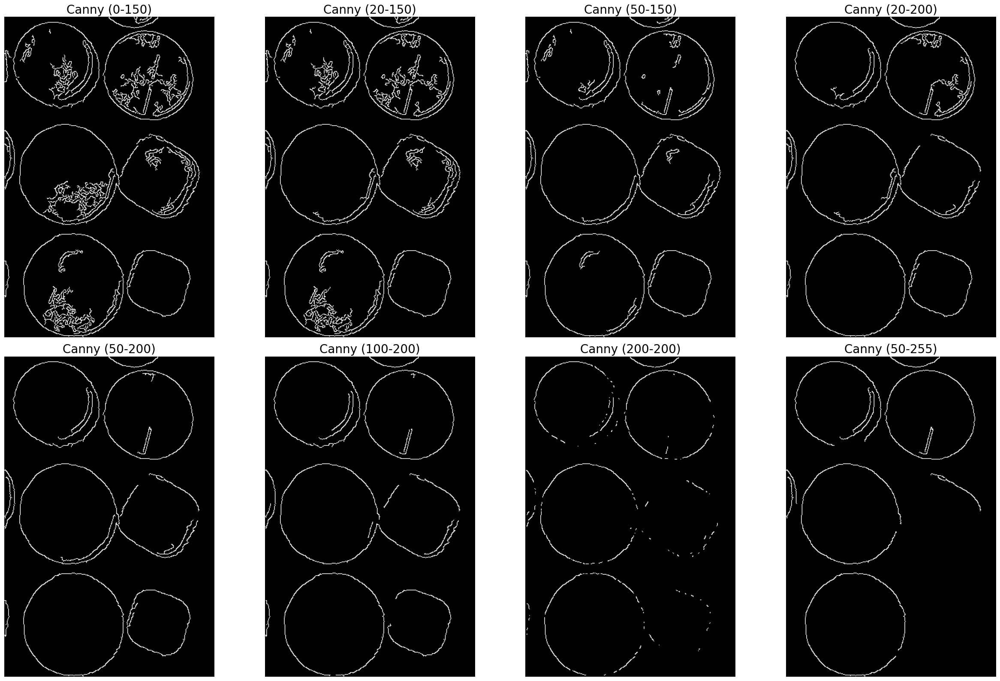

In [47]:
img = cv2.GaussianBlur(coins_noise, (7, 7), 0)
thresholds = [(0, 150), (20, 150), (50, 150), (20, 200), (50, 200), (100, 200), (200, 200), (50, 255)]

plt.figure(figsize=(25, 16))
for i, (min_treah, max_tresh) in enumerate(thresholds):
    plt.subplot(2, 4, i + 1)
    plt.imshow(cv2.Canny(img, min_treah, max_tresh), cmap='gray')
    plt.title(f'Canny ({min_treah}-{max_tresh})', fontsize=20)
    plt.axis('off')

plt.tight_layout()
plt.show()

---

##### Zad. 3: Wyrównanie histogramu

Wyrównaj histogram obrazu `coins_noise`. Wyniki zaprezentuj za pomocą obrazów i towarzyszących im histogramów. Oceń uzyskaną zmianę w obrazie.

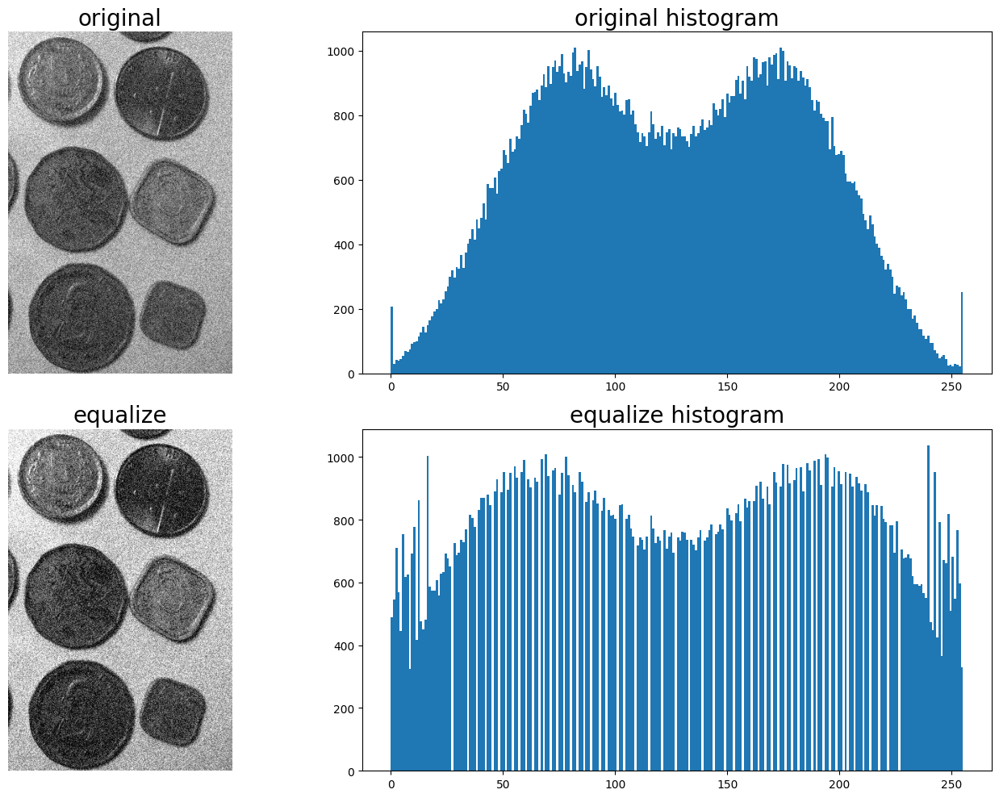

In [48]:
images = [('original', coins_noise), ('equalize', cv2.equalizeHist(coins_noise))]

plt.figure(figsize=(15, 10))
for i, (name, img) in enumerate(images):
    plt.subplot(2, len(images), 2 * i + 1)
    plt.imshow(img, cmap='gray')
    plt.title(f'{name}', fontsize=20)
    plt.axis('off')

    plt.subplot(2, len(images), 2 * i + 2)
    plt.hist(img.flatten(), bins=256)
    plt.title(f'{name} histogram', fontsize=20)

plt.tight_layout()
plt.show()

---

##### Zad. 4: Transformacja do rozkładu docelowego

Dla obrazu `hare_gray` wykonaj transformację do wybranego (założonego przez siebie) rozkładu docelowego, tak aby zmaksymalizować możliwość wyodrębnienia obiektu z otoczenia (zająca) przy użyciu algorytmu binaryzacji Otsu. Zacznij od zastanowienia się nad doborem rozkładu docelowego (możesz zbadać zachowanie transformacji w zależności od wybranego rozkładu).

Podpowiedź: przedstawiona we wstępie teoretycznym transformacja obu rozkładów (źródłowego i docelowego) do rozkładu jednostajnego _nie musi_ zostać faktycznie wykonana (dlatego nie używaj w zadaniu funkcji `cv2.equalizeHist`)! Wystarczy porównywanie ze sobą wartości ze skumulowanych rozkładów (rysunek 3).

Podpowiedź 2: [cv2.LUT](https://docs.opencv.org/4.5.3/d2/de8/group__core__array.html#gab55b8d062b7f5587720ede032d34156f)

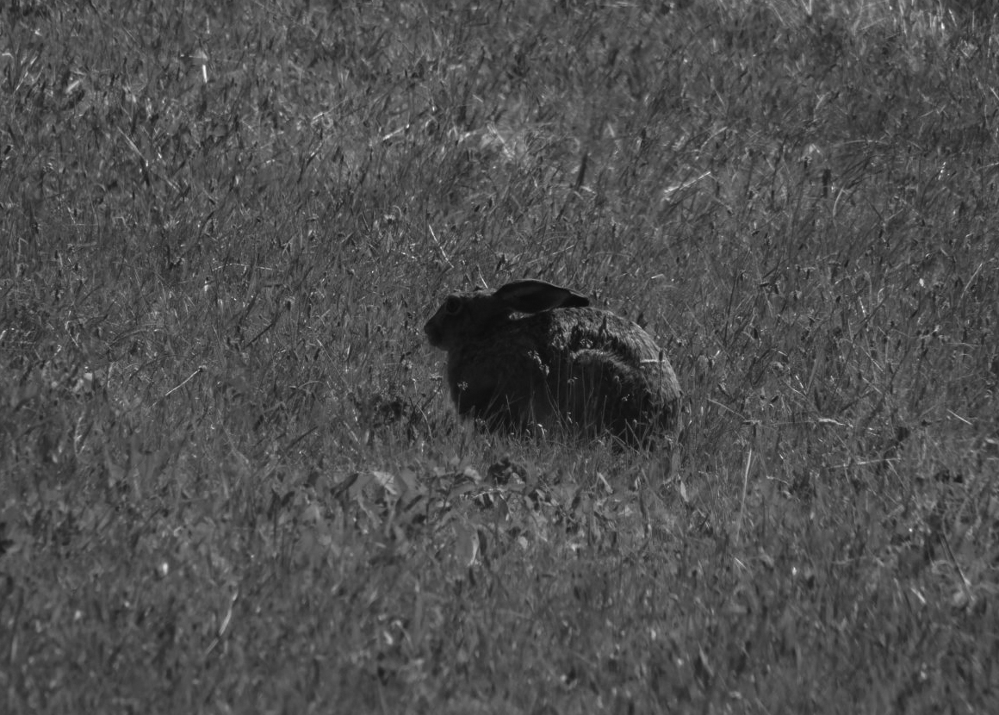

In [49]:
hare_gray = cv2.imread('Zajac.jpg', cv2.IMREAD_GRAYSCALE)
Image.fromarray(hare_gray)

Rozwiązanie:

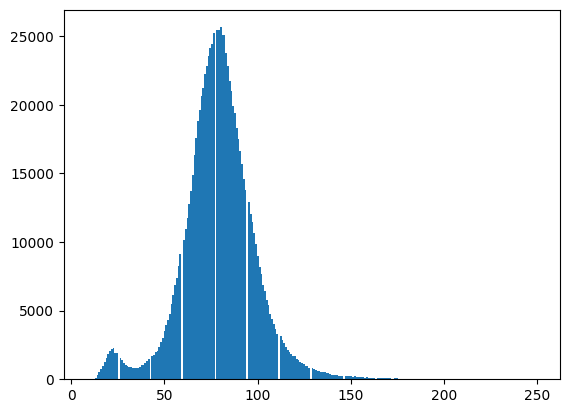

In [50]:
_ = plt.hist(hare_gray.flatten(), bins=256)

In [51]:
from skimage.exposure import cumulative_distribution

def get_CDF(image):
    cdf, bins = cumulative_distribution(image)
    cdf = np.insert(cdf, 0, [0]*bins[0])
    cdf = np.append(cdf, [1]*(255-bins[-1]))
    return cdf

In [86]:
def histMatch(cdfInput, cdfTemplate, imageInput):
    cdfInput = (cdfInput - cdfInput.min()) / (cdfInput.max() - cdfInput.min()) * 255
    cdfTemplate = (cdfTemplate - cdfTemplate.min()) / (cdfTemplate.max() - cdfTemplate.min()) * 255
    
    # lut = np.interp(np.arange(256), cdfInput, cdfTemplate).astype(np.uint8)
    lut = np.array([np.argmin(abs(cdfTemplate - x)) for x in cdfInput], dtype = np.uint8)
    imageMatch = cv2.LUT(imageInput, lut)
    
    return imageMatch

In [53]:
def create_gaussian_mixture_cdf(mean1=50, std1=10, mean2=200, std2=10, w1=0.3, w2=0.7):
    x = np.arange(256)
    gauss1 = (1/(std1 * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((x - mean1) / std1) ** 2)
    gauss2 = (1/(std2 * np.sqrt(2 * np.pi))) * np.exp(-0.5 * ((x - mean2) / std2) ** 2)
    combined_gauss = w1 * gauss1 + w2 * gauss2 / (w1 + w2)
    combined_gauss /= combined_gauss.sum()
    cdf = np.cumsum(combined_gauss)
    return cdf, combined_gauss

In [54]:
cdf_original = get_CDF(hare_gray)

In [55]:
def test_cdf_target(cdf_target, target_hist):
    img_tranformed = histMatch(cdf_original, cdf_target, hare_gray)
    
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(cdf_original, linewidth=5, label='oryginal')
    plt.plot(cdf_target, linewidth=5, label='target')
    plt.xlim(0,255)
    plt.ylim(0,1)
    plt.xlabel('Pixel Values')
    plt.ylabel('Cumulative Probability')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.bar(np.arange(256), target_hist)
    plt.title('Target distribution')
    plt.xlabel('Pixel Values')
    plt.ylabel('Probability')

    plt.tight_layout()
    plt.show()

    images = [('original', hare_gray), ('processed', img_tranformed)]

    plt.figure(figsize=(12, 8))
    for i, (name, img) in enumerate(images):
        plt.subplot(2, len(images), 2 * i + 1)
        plt.imshow(img, cmap='gray')
        plt.title(f'{name}', fontsize=20)
        plt.axis('off')

        plt.subplot(2, len(images), 2 * i + 2)
        plt.hist(img.flatten(), bins=256)
        plt.title(f'{name} histogram', fontsize=20)

    plt.tight_layout()
    plt.show()

    (T, original_tresh) = cv2.threshold(hare_gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    (T, transformed_tresh) = cv2.threshold(img_tranformed, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    plt.figure(figsize=(10,7))
    plt.subplot(1,2,1)
    plt.title('Original tresholded')
    plt.imshow(original_tresh, cmap='gray')
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.title('Transformed tresholded')
    plt.imshow(transformed_tresh, cmap='gray')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

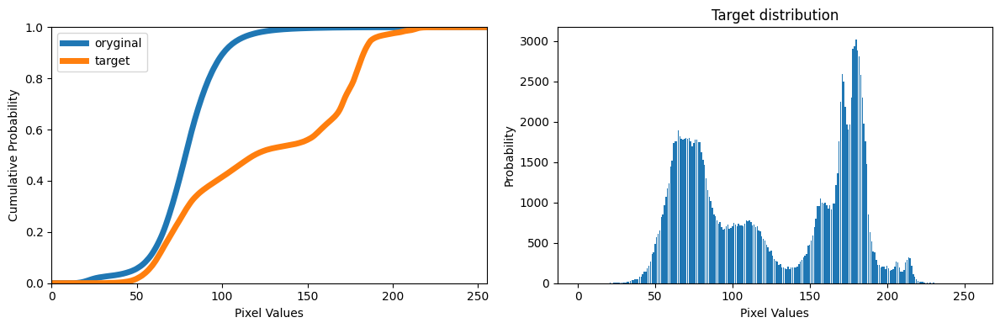

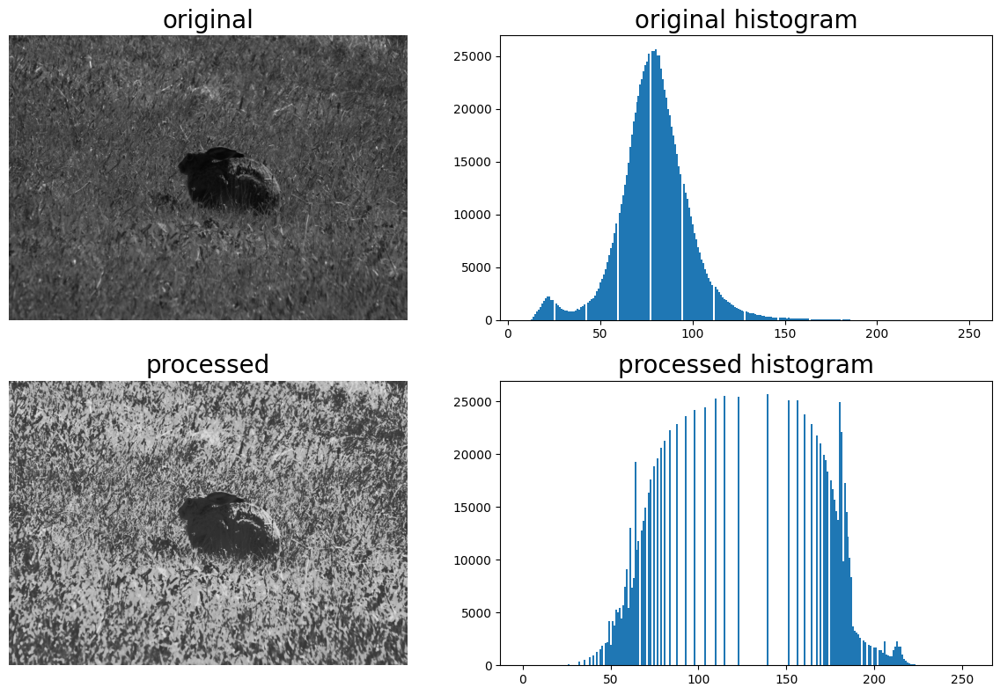

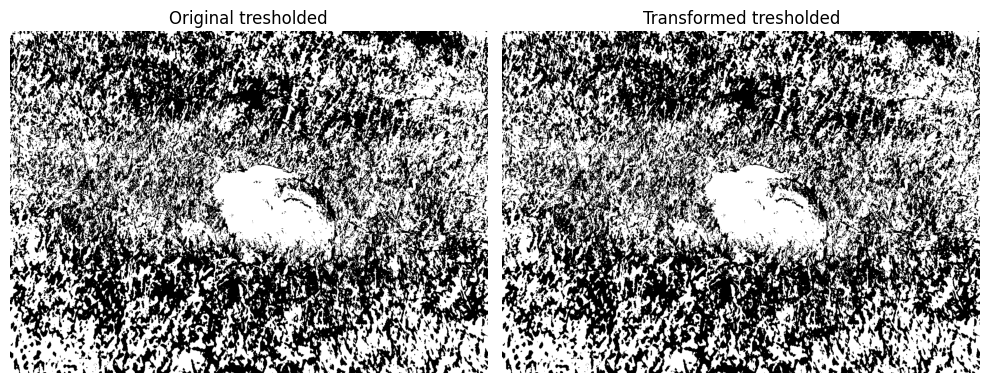

In [87]:
cdf_target = get_CDF(coins)
target_hist, _ = np.histogram(coins, bins=256, range=[0, 256])
test_cdf_target(cdf_target, target_hist)

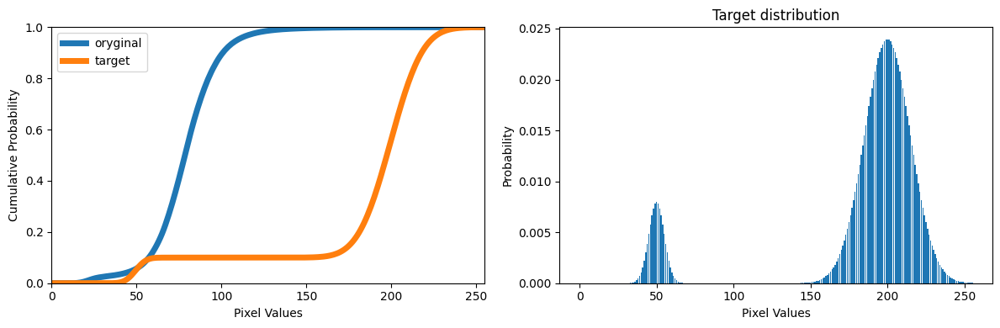

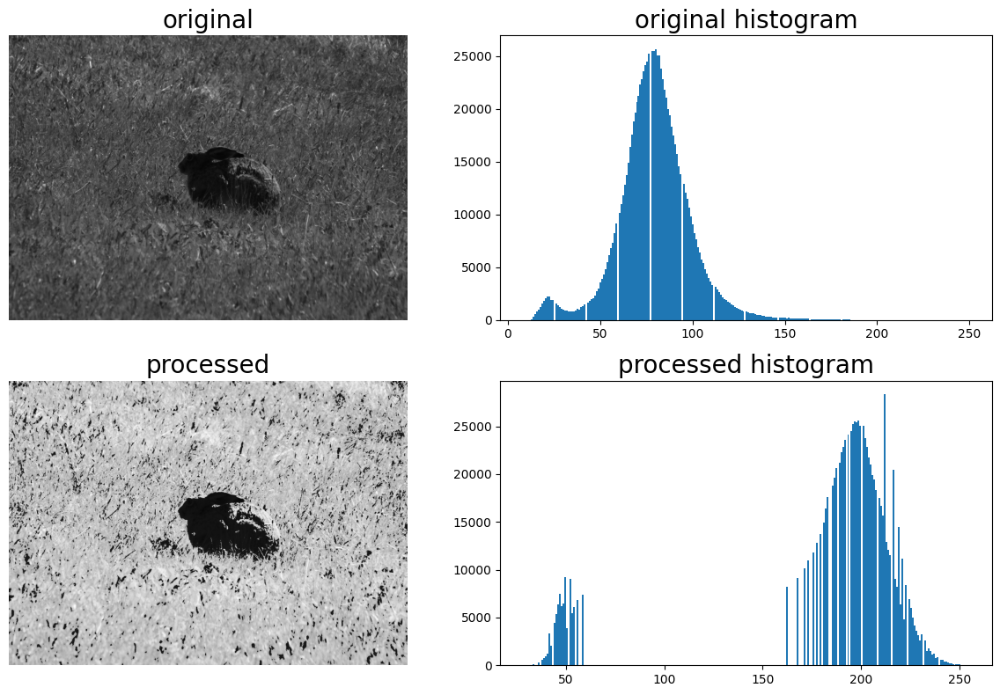

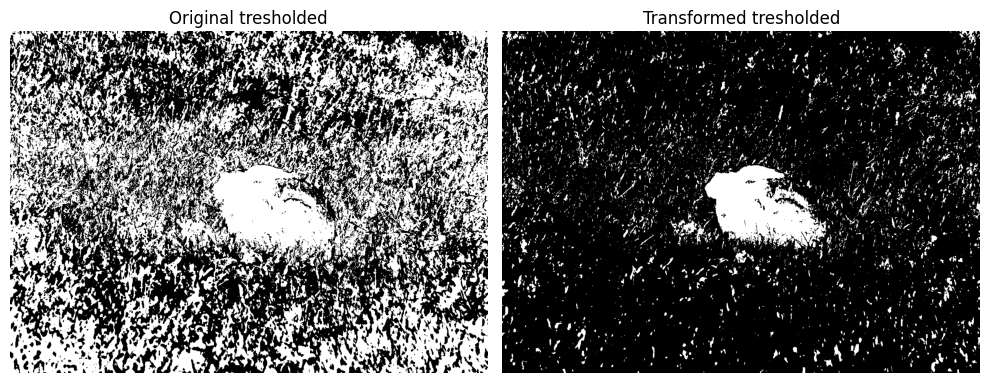

In [88]:
cdf_target, target_hist = create_gaussian_mixture_cdf(mean1=50, std1=5, mean2=200, std2=15, w1=0.1, w2=0.9)
test_cdf_target(cdf_target, target_hist)

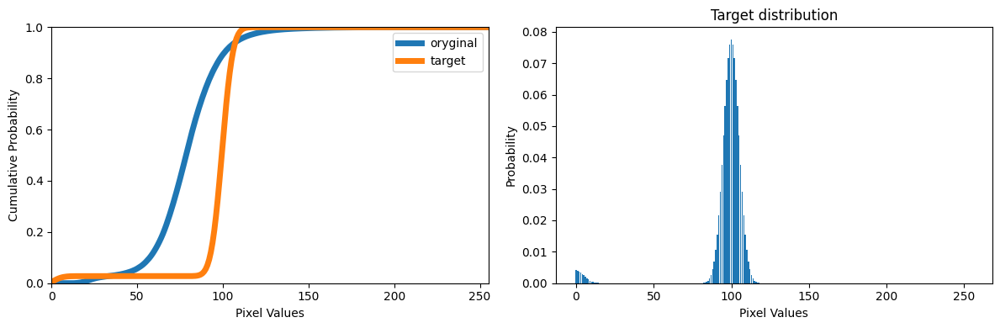

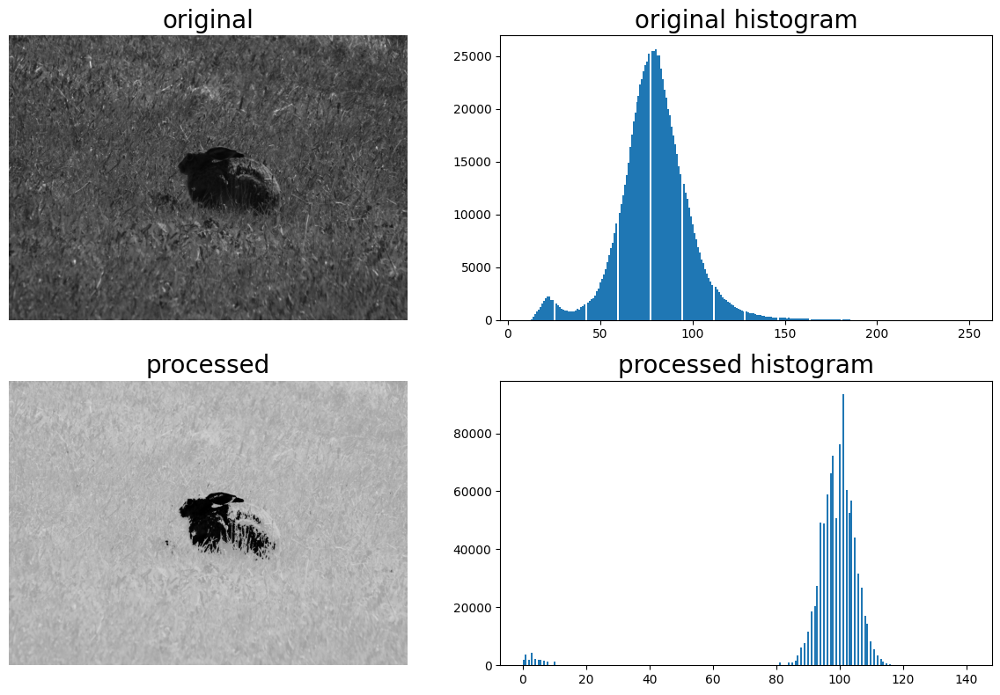

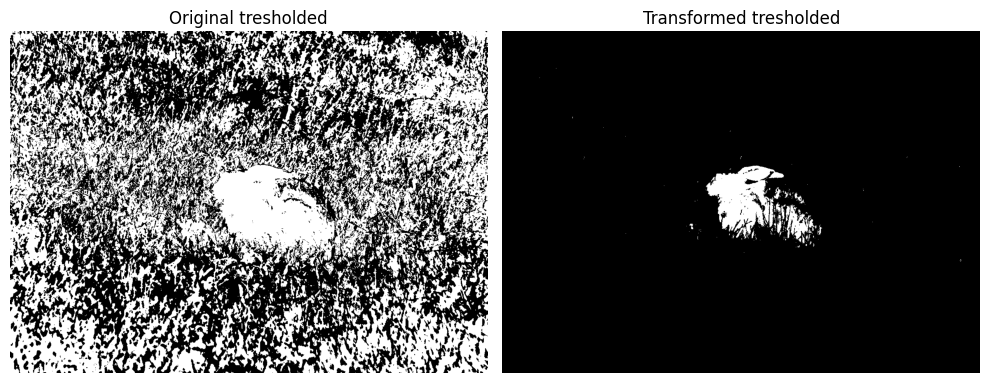

In [96]:
cdf_target, target_hist = create_gaussian_mixture_cdf(mean1=0, std1=5, mean2=100, std2=5, w1=0.05, w2=0.95)
test_cdf_target(cdf_target, target_hist)

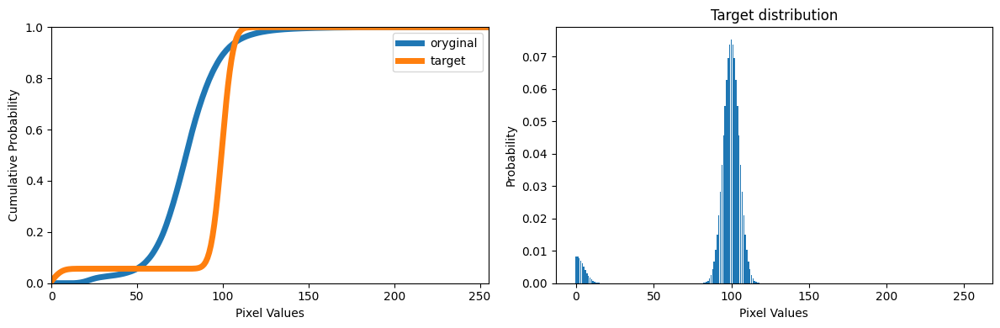

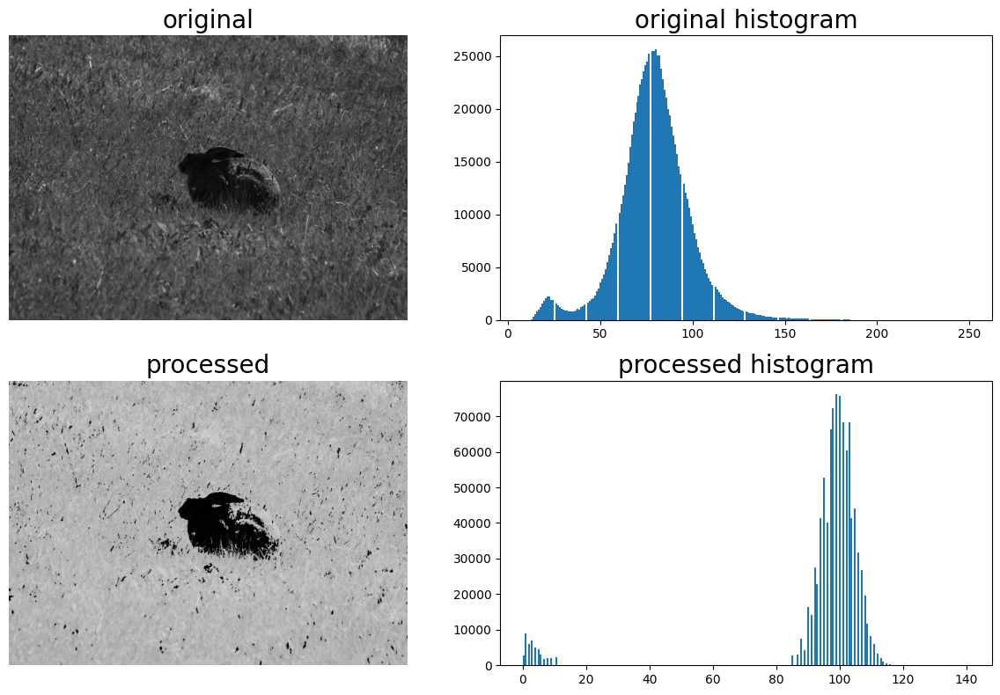

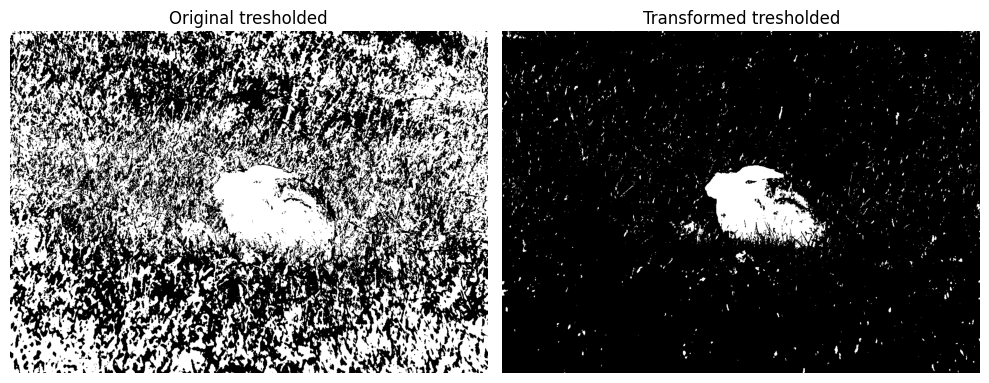

In [100]:
cdf_target, target_hist = create_gaussian_mixture_cdf(mean1=0, std1=5, mean2=100, std2=5, w1=0.1, w2=0.9)
test_cdf_target(cdf_target, target_hist)

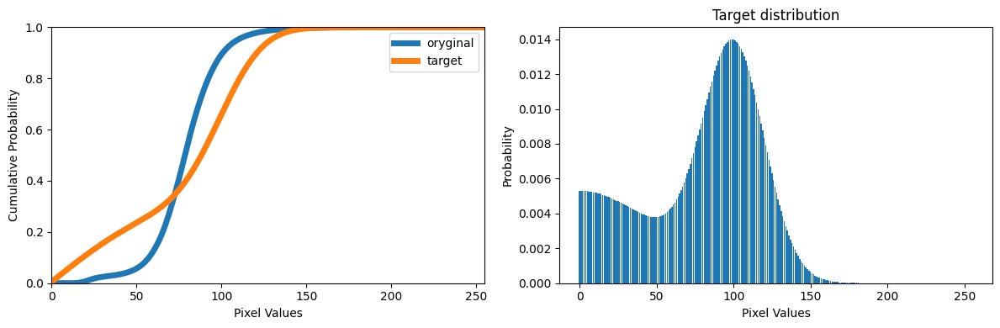

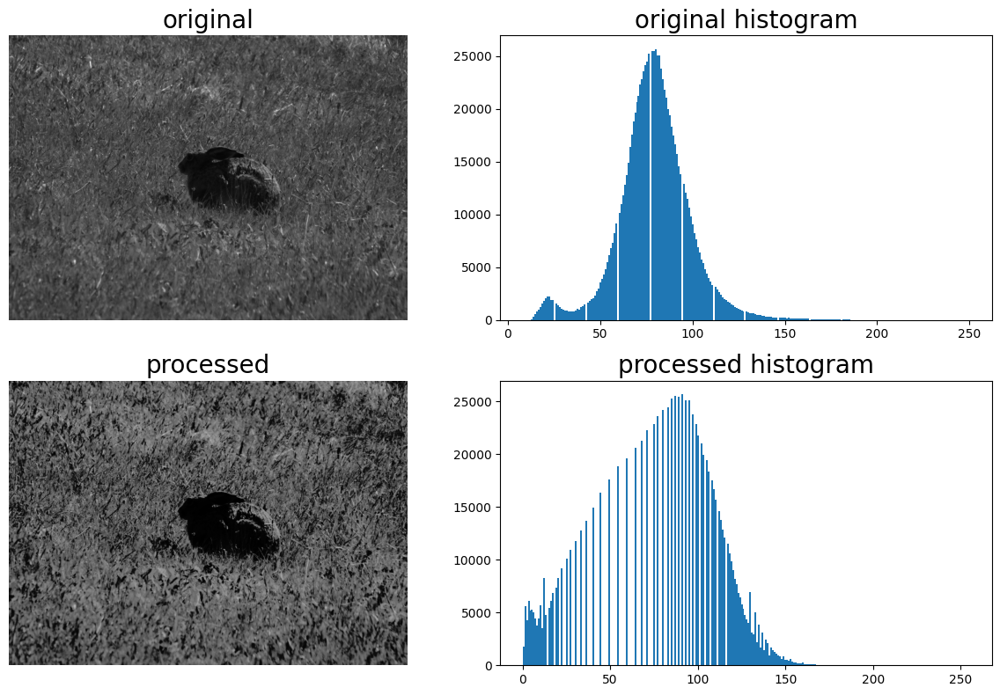

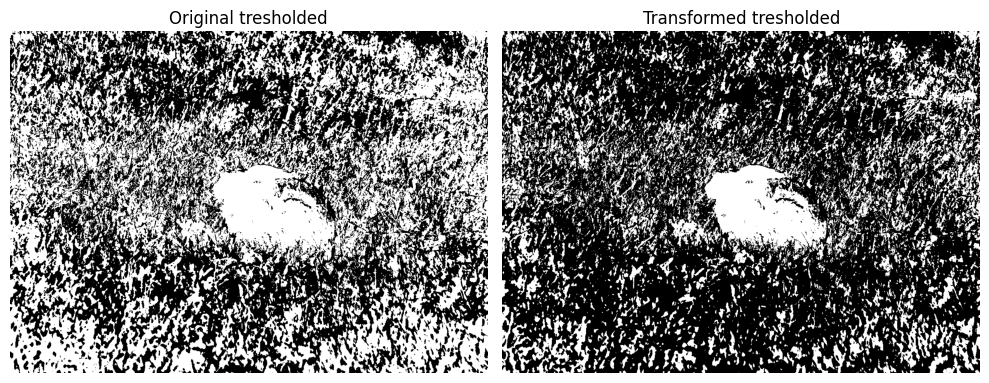

In [110]:
cdf_target, target_hist = create_gaussian_mixture_cdf(mean1=00, std1=50, mean2=100, std2=20, w1=0.5, w2=0.5)
test_cdf_target(cdf_target, target_hist)